In [3]:
import numpy as np
import torch

# from Fpn import FPN
import cv2
import matplotlib.pyplot as plt
import math
import os
from deeplab import deeplabv3
from pspnet import PSPNet
import json
import torch.nn as nn
from skimage.segmentation import slic
import segmentation_models_pytorch as sm
from misc import *

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model = FPN(in_channels=1, classes=9)
model = sm.PSPNet(encoder_name='resnet34', encoder_weights = None, encoder_depth = 3, psp_out_channels = 512, classes=5, activation="sigmoid")
# model = deeplabv3(pretrained=False, progress=True, num_classes=9)
model.to(device=device)
model.load_state_dict(torch.load("./checkpoints/Final_model.pth", map_location=device))

<All keys matched successfully>

In [5]:
model

PSPNet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

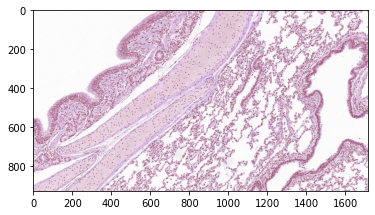

In [6]:
im = cv2.imread("./test_images/21.806.test3.10X.colormanagment.jpg")
plt.imshow(increase_brightness(im, value=10))

im_h, im_w = im.shape[:-1]
window_size = 512
step_size = 256
batch = []
for i in range(0, im_h-window_size, step_size):
    for j in range(0, im_w-window_size, step_size):
        batch.append(im[i:i+window_size, j:j+window_size])
    batch.append(im[i:i+window_size, im_w-window_size:im_w])
for j in range(0, im_w-window_size, step_size):
    batch.append(im[im_h-window_size:im_h, j:j+window_size])
batch.append(im[im_h-window_size:im_h, im_w-window_size:im_w])
batch = np.moveaxis(np.array(batch), -1, 1)
# batch = nn.functional.interpolate(torch.Tensor(batch), size=(256, 256), 
#                                      scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device=device)

In [8]:
# im = cv2.imread("test_images/21.806.test3.10X.colormanagment.jpg")
# plt.imshow(im)
# im_h, im_w = im.shape[:-1]
# window_size = 512
# step_size = 256
# batch = []
# for i in range(0, im_h-window_size, step_size):
#     for j in range(0, im_w-window_size, step_size):
#         batch.append(im[i:i+window_size, j:j+window_size])
#     batch.append(im[i:i+window_size, im_w-window_size:im_w])
# for j in range(0, im_w-window_size, step_size):
#     batch.append(im[im_h-window_size:im_h, j:j+window_size])
# batch.append(im[im_h-window_size:im_h, im_w-window_size:im_w])
# batch = np.moveaxis(np.array(batch), -1, 1)
# # batch = nn.functional.interpolate(torch.Tensor(batch), size=(256, 256), 
# #                                      scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device=device)

In [7]:
batch = nn.functional.interpolate(torch.from_numpy(batch)/255, size=(256, 256), 
                                     scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device=device)
batch.shape

torch.Size([18, 3, 256, 256])

In [8]:
outs = model(batch).detach()

In [9]:
outs.shape

torch.Size([18, 5, 256, 256])

In [10]:
outs = nn.functional.interpolate(outs, size=(512, 512), 
                                     scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device="cpu").numpy()

In [11]:
outs.shape

(18, 5, 512, 512)

In [12]:
# out = np.squeeze(outs*255).astype(np.uint8)
out = np.zeros((5, im_h, im_w))
n = 0
for i in range(0, im_h-window_size, 256):
    for j in range(0, im_w-window_size, 256):
        out[:, i:i+window_size, j:j+window_size] = outs[n]
        n += 1
    out[:, i:i+window_size, im_w-window_size:im_w] = outs[n]
    n +=1
for j in range(0, im_w-window_size, 256):
    out[:, im_h-window_size:im_h, j:j+window_size] = outs[n]
    n += 1
out[:, im_h-window_size:im_h, im_w-window_size:im_w] = outs[n]

In [13]:
# # labels = {0: 'Respiratory epithelium',  1: 'Smooth muscle',  2: 'Macrophage',  3: 'Edema',  4: 'Alveolar septae',  5: 'Red blood cell(s)',  6: 'Lamina propria',  7: 'Cartilage'}
# fig, axs = plt.subplots(4, 3, figsize=(120, 120))
# axs[0, 0].imshow(im)
# axs[0, 0].set_title(i, fontsize=50)
# for n,i in enumerate(range(out.shape[0])):
#     axs[int(i/3)+1, int(i%3)].imshow(out[i]>0.5)
# #     axs[int(i/3)+1, int(i%3)].set_title(labels[n], fontsize=50)

In [14]:
segments = slic(im, n_segments=1000, compactness=28)
segments = segments

In [15]:
out_2 = np.zeros_like(out)
for j in range(out_2.shape[0]):
    for i in np.unique(segments):
        out_2[j][np.where(segments==i)] = np.mean(out[j][np.where(segments==i)], axis=0)

In [19]:
classes = os.listdir("./histology_dataset/20/train/GT/")
classes.sort()
labels = {n:i for n,i in enumerate(classes)}

In [137]:
def highlight_im(im, mask, threshold=0.5):
    threshold = int(threshold*255)
    mask = (mask*255).astype(np.uint8)
    ret, binary = cv2.threshold(mask, threshold, 255, cv2.THRESH_BINARY)
    
    contours,hierarchy = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

    for contour in contours:
        cv2.drawContours(im, contour, -1, (255,0,0), thickness = 1)

    b,g,r = cv2.split(im)

#     b = cv2.add(b, 100, dst = b, mask = binary, dtype = cv2.CV_8U)
#     g = cv2.add(g, 100, dst = g, mask = binary, dtype = cv2.CV_8U)
    r = cv2.add(r, 100, dst = r, mask = binary, dtype = cv2.CV_8U)

    return cv2.merge((b,g,r), im)

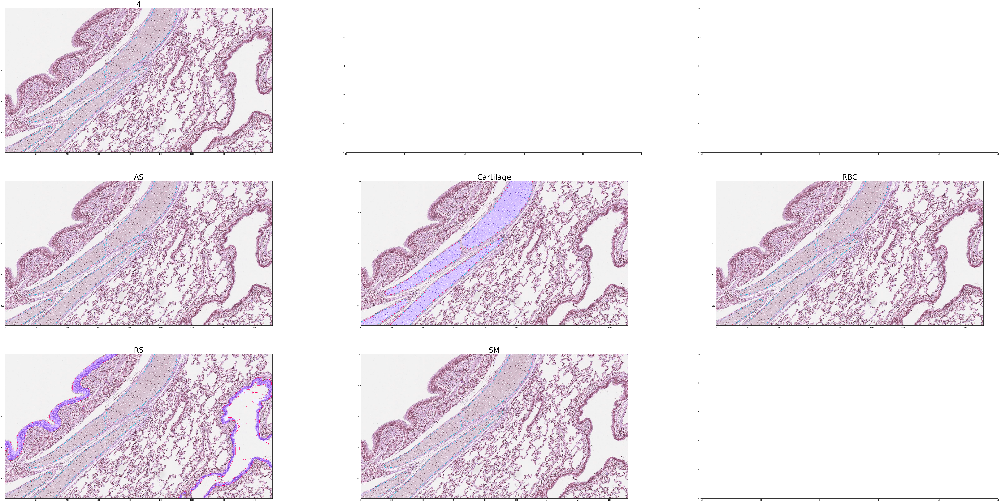

In [138]:
fig, axs = plt.subplots(3, 3, figsize=(120, 60))
axs[0, 0].imshow(im)
axs[0, 0].set_title(i, fontsize=50)
for n,i in enumerate(range(out_2.shape[0])):
    axs[int(i/3)+1, int(i%3)].imshow(highlight_im(im.copy(), out[i].copy()))
    axs[int(i/3)+1, int(i%3)].set_title(labels[n], fontsize=50)

In [ ]:
def highlight_im(im, masks, threshold=0.5):
    threshold = int(threshold*255)
    mask = (masks*255).astype(np.uint8)
    ret, binary = cv2.threshold(mask, threshold, 255, cv2.THRESH_BINARY)
    
    contours,hierarchy = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

    for contour in contours:
        cv2.drawContours(im, contour, -1, (255,0,0), thickness = 1)

    b,g,r = cv2.split(im)
    
    for i in masks:

#     b = cv2.add(b, 100, dst = b, mask = binary, dtype = cv2.CV_8U)
#     g = cv2.add(g, 100, dst = g, mask = binary, dtype = cv2.CV_8U)
    r = cv2.add(r, 100, dst = r, mask = binary, dtype = cv2.CV_8U)

    return cv2.merge((b,g,r), im)

In [60]:
x = highlight_im(im.copy(), out[1].copy())

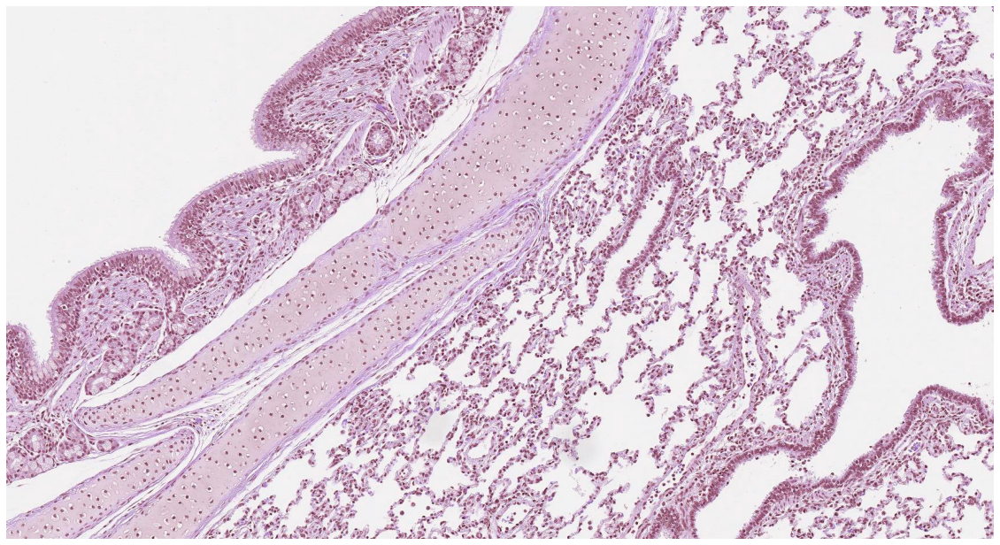

In [153]:
mask = (out[1]*255).astype(np.uint8)
ret, binary = cv2.threshold(mask, 0.5, 255, cv2.THRESH_BINARY)
b,g,r = cv2.split(im)
r = cv2.add(r, 100, dst = r, mask = binary, dtype = cv2.CV_8U)

# plt.imshow(cv2.merge((b,g,r), im))
fig, axs = plt.subplots(1, figsize=(20, 20))
axs.axis('off')
axs.imshow(im)